In [139]:
import sys
sys.path.append('/orange/adamginsburg/ALMA_IMF/reduction/analysis')
from spectralindex import prefixes
from astropy.visualization import simple_norm
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes, inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
from mpl_toolkits.axes_grid1.inset_locator import TransformedBbox, BboxPatch, BboxConnector
import astropy.visualization.wcsaxes
from spectral_cube import SpectralCube
import field_data
from astropy import units as u

In [140]:
import warnings

In [141]:
%matplotlib inline
import pylab as pl

In [142]:
os.chdir('/orange/adamginsburg/ALMA_IMF/2017.1.01355.L/February2021Release/')

In [143]:
    prefixes['W43MM1'] = dict(
        finaliter_prefix_b3="W43-MM1/B3/cleanest/W43-MM1_B3_uid___A001_X1296_X1af_continuum_merged_12M_robust0_selfcal4_finaliter",
        finaliter_prefix_b6="W43-MM2/B6/cleanest/W43-MM2_B6_uid___A001_X1296_X113_continuum_merged_12M_robust0_selfcal5_finaliter",)

In [144]:
prefixes.keys()

dict_keys(['G328', 'G333', 'G12', 'W51IRS2', 'G008', 'G327', 'G10', 'G337', 'G338', 'G351', 'G353', 'W43MM3', 'W43MM2', 'W51-E', 'W43MM1'])

In [150]:
zoom_parameters = {}

In [126]:
warnings.simplefilter('ignore')

In [145]:
zoom_parameters[('G008', 'B3')] = [{'xl':1500, 'xr':1900, 'yl':600, 'yu':1000, 
                                    'inset_pars':{'loc': 1, 'width':3, 'height':3,},
                                    'mark_inset_pars':{'loc1':2, 'loc2':4,},
                                    'vis_pars':{'max_percent':99.995, 'min_percent': 0, 'stretch':'log'}
                                   },
                                   {'xl':700, 'xr':850, 'yl':1025, 'yu':1175, 
                                    'inset_pars':{'loc': 3, 'width':3, 'height':3,},
                                    'mark_inset_pars':{'loc1':2, 'loc2':4,},
                                    'vis_pars':{'max_percent':99.9, 'min_percent': 2, 'stretch':'linear'}
                                   },
                                  ]

zoom_parameters[('G008', 'B3')] = [{'xl':1500, 'xr':1900, 'yl':600, 'yu':1000, 
                                    'inset_pars':{'loc': 1, 'width':3, 'height':3,  'bbox_to_anchor':(600, 0, 100,100)},
                                    'mark_inset_pars':{'loc1':1, 'loc2':3,},
                                    'vis_pars':{'max_percent':99.995, 'min_percent': 0, 'stretch':'log'}
                                   },
                                   {'xl':700, 'xr':850, 'yl':1025, 'yu':1175, 
                                    'inset_pars':{'loc': 3, 'width':3, 'height':3,  'bbox_to_anchor':(0, -120, 100,100)},
                                    'mark_inset_pars':{'loc1':2, 'loc2':4,},
                                    'vis_pars':{'max_percent':99.9, 'min_percent': 2, 'stretch':'linear'}
                                   },
                                  ]

In [146]:
def make_scalebar(ax, left_side, length, color='w', linestyle='-', label='',
                  fontsize=12, text_offset=0.1*u.arcsec):
    axlims = ax.axis()
    lines = ax.plot(u.Quantity([left_side.ra, left_side.ra-length]),
                    u.Quantity([left_side.dec]*2),
                    color=color, linestyle=linestyle, marker=None,
                    transform=ax.get_transform('fk5'),
                   )
    txt = ax.text((left_side.ra-length/2).to(u.deg).value,
                  (left_side.dec+text_offset).to(u.deg).value,
                  label,
                  verticalalignment='bottom',
                  horizontalalignment='center',
                  transform=ax.get_transform('fk5'),
                  color=color,
                  fontsize=fontsize,
                 )
    ax.axis(axlims)
    return lines,txt


In [147]:
from astropy.visualization import AsinhStretch
from astropy.stats import mad_std

In [148]:
def make_zoom(fieldid, zoom_parameters,
              overview_vis_pars={'max_percent':99.5, 'min_percent':0.5, 'stretch':'linear'},
              overview_cmap='gray_r',
              inset_cmap='inferno',
              band='B3',
              nsigma=5):
    
    pfxs = prefixes[fieldid]

    finaliter_prefix = pfxs[f'finaliter_prefix_{band}'.lower()]
    image = SpectralCube.read(f'{finaliter_prefix}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

    fig = pl.figure(figsize=(12,12))

    fig = pl.figure(1, figsize=(10,10))
    fig.clf()
    ax = fig.add_subplot(projection=image.wcs.celestial)

    img = image[0].value
    img[img==0] = np.nan
    mad = mad_std(img, ignore_nan=True)
    
    norm = simple_norm(img, **overview_vis_pars)
    
    if hasattr(norm.stretch, 'a') and nsigma is not None:
        a_point = (np.nanmedian(img) + nsigma*mad) / norm.vmax
        norm.stretch.a = a_point
        print(np.nanmedian(img), nsigma, mad, nsigma*mad, norm.vmax, a_point)

    
    ax.imshow(img, cmap=overview_cmap, norm=norm)

    tick_fontsize=16
    ra = ax.coords['ra']
    ra.set_major_formatter('hh:mm:ss.s')
    dec = ax.coords['dec']
    ra.set_axislabel("RA (J2000)", fontsize=20)
    dec.set_axislabel("Dec (J2000)", fontsize=20, minpad=0.0)
    ra.ticklabels.set_fontsize(tick_fontsize)
    ra.set_ticks(exclude_overlapping=True)
    dec.ticklabels.set_fontsize(tick_fontsize)
    dec.set_ticks(exclude_overlapping=True)

    for zp in zoom_parameters:

        xl,xr = zp['xl'], zp['xr']
        yl,yu = zp['yl'], zp['yu']
        slc = [slice(yl,yu), slice(xl,xr)]
        axins = inset_axes(ax, **zp['inset_pars'],
                           axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                           axes_kwargs=dict(wcs=image[0][slc].wcs.celestial))

        norm2 = simple_norm(img, **zp['vis_pars'])

        axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap=inset_cmap, norm=norm2)
        mark_inset(parent_axes=ax, inset_axes=axins,
                   fc="none", ec="b", **zp['mark_inset_pars'])
        ra = axins.coords['ra']
        dec = axins.coords['dec']
        axins.set_xticklabels([])
        axins.set_yticklabels([])
        axins.xaxis.set_visible(False)
        axins.yaxis.set_visible(False)
        ra.set_ticks_visible(False)
        dec.set_ticks_visible(False)
        ra.set_axislabel('')
        dec.set_axislabel('')
        ra.ticklabels.set_visible(False)
        dec.ticklabels.set_visible(False)

    pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms_{band}.png', bbox_inches='tight')
    pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms_{band}.pdf', bbox_inches='tight')

2.1856156e-06 3 0.00014277494725842494 0.0004283248417752748 0.000575161916203798 0.7485030653666146


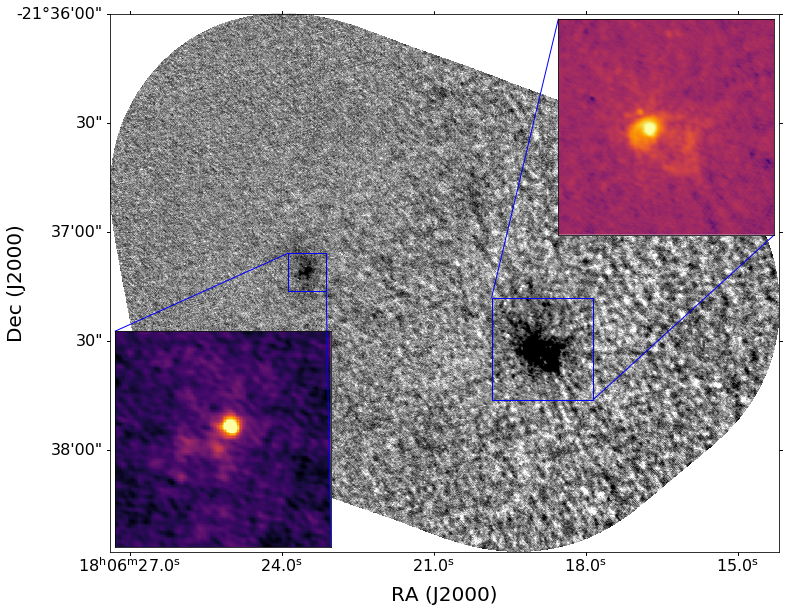

In [149]:
make_zoom('G008', zoom_parameters[('G008', 'B3')], overview_vis_pars={'max_percent':99.5, 'min_percent':0.5, 'stretch':'asinh'}, nsigma=3)

2.1856156e-06 5 0.00014277494725842494 0.0007138747362921247 0.000575161916203798


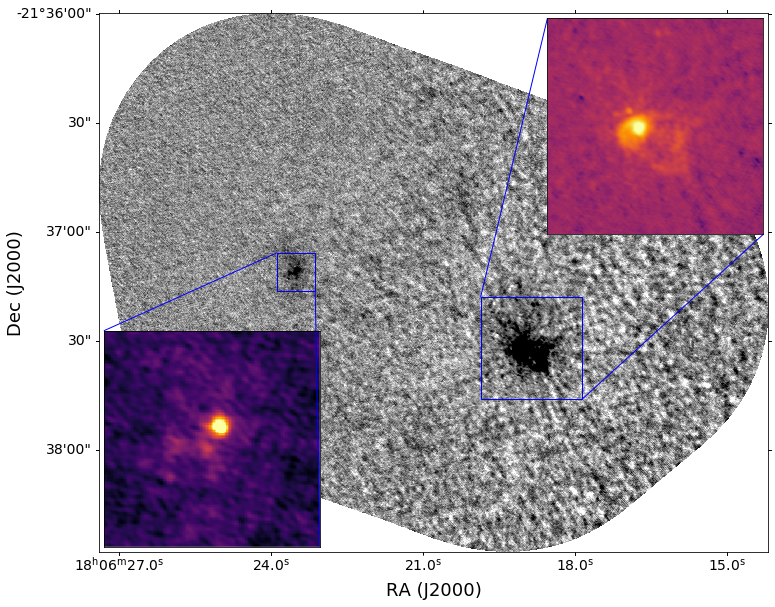

In [130]:
fieldid = 'G008'
pfxs = prefixes[fieldid]

finaliter_prefix_b3 = pfxs['finaliter_prefix_b3']
image_b3 = SpectralCube.read(f'{finaliter_prefix_b3}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

fig = pl.figure(figsize=(12,12))

fig = pl.figure(1, figsize=(10,10))
fig.clf()
ax = fig.add_subplot(projection=image_b3.wcs.celestial)

img = image_b3[0].value
norm = simple_norm(img, max_percent=99.5, min_percent=0.5, stretch='asinh')

mad = mad_std(img, ignore_nan=True)

nsigma = 5
if hasattr(norm.stretch, 'a') and nsigma is not None:
    print(np.nanmedian(img), nsigma, mad, nsigma*mad, norm.vmax)
    
    a_point = (np.nanmedian(img) + nsigma*mad) / norm.vmax
    norm.stretch.a = a_point



ax.imshow(img, cmap='gray_r', norm=norm)



tick_fontsize=14
ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("RA (J2000)", fontsize=18)
dec.set_axislabel("Dec (J2000)", fontsize=18, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticks(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticks(exclude_overlapping=True)



xl,xr = 1500,1900
yl,yu = 600,1000
slc = [slice(yl,yu), slice(xl,xr)]
axins = inset_axes(ax, loc=1, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))

norm2 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='log')

axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap='inferno', norm=norm2)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


bx,tx = (700,850)
by,ty = (1025,1175)
slc = [slice(by,ty), slice(bx,tx)]
axins = inset_axes(ax, loc=3, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
norm3 = simple_norm(img, max_percent=99.9, min_percent=2, stretch='linear')
axins.imshow(img[slc], extent=[bx,tx,by,ty], cmap='inferno', norm=norm3)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)



pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms_B3.png', bbox_inches='tight')
pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms_B3.pdf', bbox_inches='tight')

(array([0.00000e+00, 3.00000e+00, 5.00000e+00, 1.50000e+01, 2.20000e+01,
        8.40000e+01, 1.39000e+02, 2.48000e+02, 4.05000e+02, 7.77000e+02,
        1.27500e+03, 2.21700e+03, 4.06200e+03, 7.55700e+03, 1.35570e+04,
        2.25200e+04, 3.80910e+04, 6.30030e+04, 1.00163e+05, 1.54776e+05,
        2.26881e+05, 3.08443e+05, 3.89541e+05, 4.48166e+05, 4.69028e+05,
        4.47055e+05, 3.88453e+05, 3.10868e+05, 2.29507e+05, 1.58575e+05,
        1.04289e+05, 6.59670e+04, 4.18650e+04, 2.60470e+04, 1.58690e+04,
        1.01450e+04, 6.54400e+03, 4.23200e+03, 2.83700e+03, 1.97500e+03,
        1.43000e+03, 1.10800e+03, 8.49000e+02, 6.88000e+02, 6.28000e+02,
        5.12000e+02, 4.76000e+02, 4.31000e+02, 4.64000e+02]),
 array([-1.00000000e-03, -9.59183673e-04, -9.18367347e-04, -8.77551020e-04,
        -8.36734694e-04, -7.95918367e-04, -7.55102041e-04, -7.14285714e-04,
        -6.73469388e-04, -6.32653061e-04, -5.91836735e-04, -5.51020408e-04,
        -5.10204082e-04, -4.69387755e-04, -4.28571429

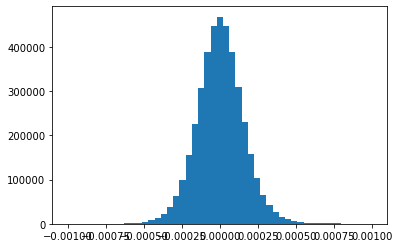

In [133]:
pl.hist(img.ravel(), bins=np.linspace(-1e-3,1e-3))

In [134]:
mad_std(img, ignore_nan=True)

0.00014277494725842494

fieldid = 'G338'
pfxs = prefixes[fieldid]

finaliter_prefix_b3 = pfxs['finaliter_prefix_b3']
image_b3 = SpectralCube.read(f'{finaliter_prefix_b3}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

fig = pl.figure(figsize=(12,12))

fig = pl.figure(1, figsize=(10,10))
fig.clf()
ax = fig.add_subplot(projection=image_b3.wcs.celestial)

img = image_b3[0].value
norm = simple_norm(img, max_percent=99.5, min_percent=0.5, stretch='linear')
ax.imshow(img, cmap='gray_r', norm=norm)



tick_fontsize=14
ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("RA (J2000)", fontsize=18)
dec.set_axislabel("Dec (J2000)", fontsize=18, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticks(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticks(exclude_overlapping=True)



xl,xr = 1050,1300
yl,yu = 1050,1300
slc = [slice(yl,yu), slice(xl,xr)]
axins = inset_axes(ax, loc=1, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))

norm2 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')

axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap='inferno', norm=norm2)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


bx,tx = (1050,1350)
by,ty = (575,875)
slc = [slice(by,ty), slice(bx,tx)]
axins = inset_axes(ax, loc=3, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
norm3 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')
axins.imshow(img[slc], extent=[bx,tx,by,ty], cmap='inferno', norm=norm3)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms_B3.png', bbox_inches='tight')
pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms_B3.pdf', bbox_inches='tight')

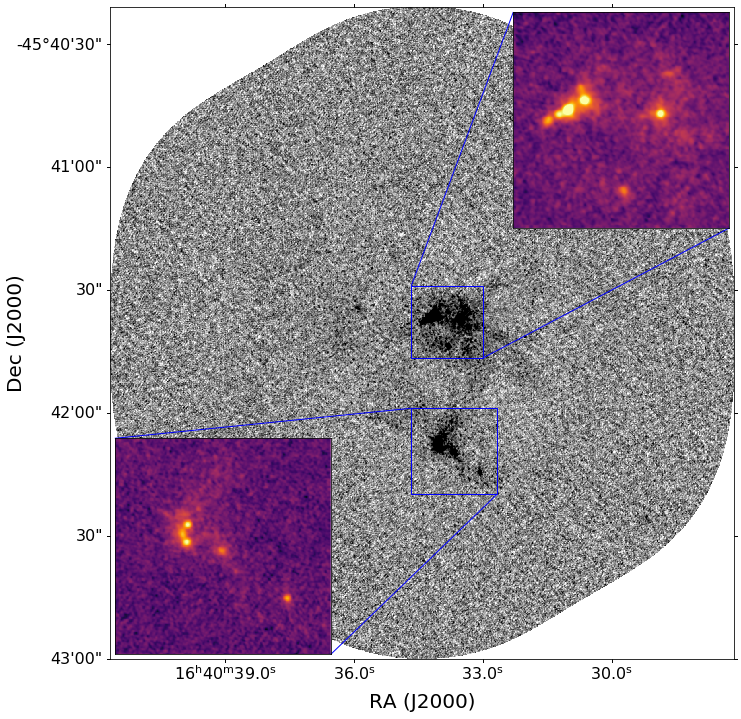

In [61]:
zoom_parameters[('G338', 'B3')] = [{'xl':1050, 'xr':1300, 'yl':1050, 'yu':1300, 
                                    'inset_pars':{'loc': 1, 'width':3, 'height':3,},
                                    'mark_inset_pars':{'loc1':2, 'loc2':4,},
                                    'vis_pars':{'max_percent':99.995, 'min_percent': 0, 'stretch':'asinh'}
                                   },
                                   {'xl':1050, 'xr':1350, 'yl':575, 'yu':875, 
                                    'inset_pars':{'loc': 3, 'width':3, 'height':3,},
                                    'mark_inset_pars':{'loc1':2, 'loc2':4,},
                                    'vis_pars':{'max_percent':99.995, 'min_percent': 0, 'stretch':'asinh'}
                                   },
                                  ]
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    make_zoom('G338', zoom_parameters[('G338', 'B3')])

/orange/adamginsburg/miniconda3/lib/python3.7/site-packages/astropy/units/quantity.py:1028: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out = super().__getitem__(key)
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return LazyMask(self._function, data=self._data[view],
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In t

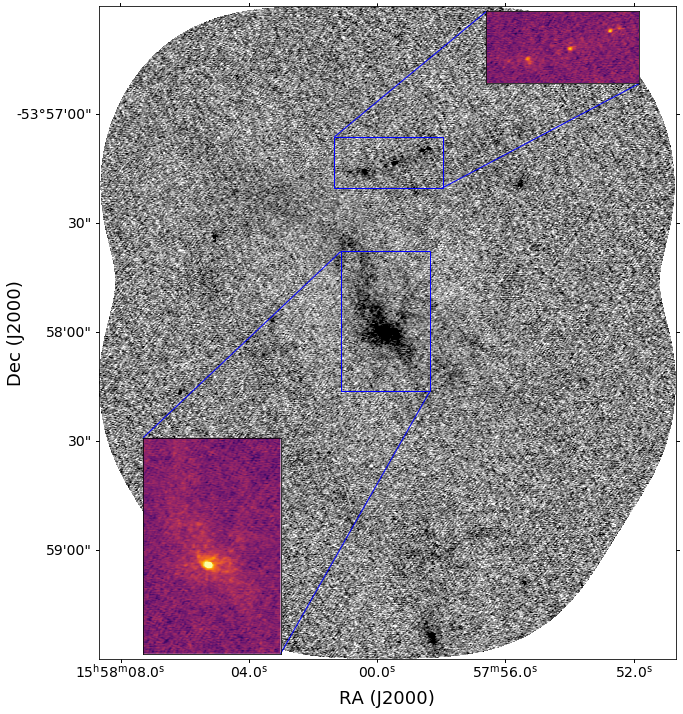

In [62]:
fieldid = 'G328'
pfxs = prefixes[fieldid]

finaliter_prefix_b3 = pfxs['finaliter_prefix_b3']
image_b3 = SpectralCube.read(f'{finaliter_prefix_b3}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

fig = pl.figure(figsize=(12,12))

fig = pl.figure(1, figsize=(10,10))
fig.clf()
ax = fig.add_subplot(projection=image_b3.wcs.celestial)

img = image_b3[0].value
norm = simple_norm(img, max_percent=99.5, min_percent=0.5, stretch='linear')
ax.imshow(img, cmap='gray_r', norm=norm)



tick_fontsize=14
ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("RA (J2000)", fontsize=18)
dec.set_axislabel("Dec (J2000)", fontsize=18, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticks(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticks(exclude_overlapping=True)



xl,xr = 925,1350
yl,yu = 1850,2050
slc = [slice(yl,yu), slice(xl,xr)]
axins = inset_axes(ax, loc=1, width=3, height=1,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))

norm2 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')

axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap='inferno', norm=norm2)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


bx,tx = 950,1300
by,ty = 1050,1600
slc = [slice(by,ty), slice(bx,tx)]
axins = inset_axes(ax, loc=3, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
norm3 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')
axins.imshow(img[slc], extent=[bx,tx,by,ty], cmap='inferno', norm=norm3)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms_B3.png', bbox_inches='tight')
pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms_B3.pdf', bbox_inches='tight')

/orange/adamginsburg/miniconda3/lib/python3.7/site-packages/astropy/units/quantity.py:1028: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out = super().__getitem__(key)
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return LazyMask(self._function, data=self._data[view],
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In t

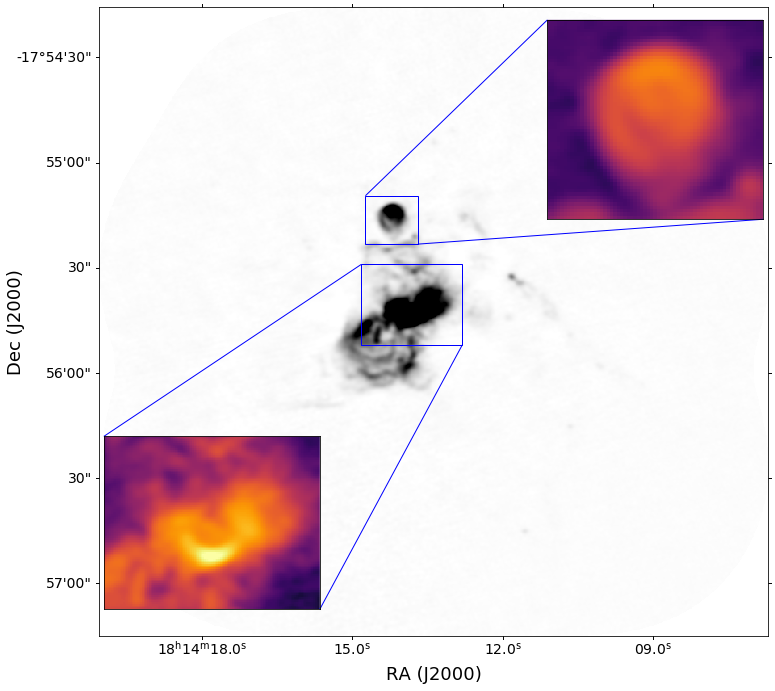

In [63]:
fieldid = 'G12'
pfxs = prefixes[fieldid]

finaliter_prefix_b3 = pfxs['finaliter_prefix_b3']
image_b3 = SpectralCube.read(f'{finaliter_prefix_b3}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

fig = pl.figure(figsize=(12,12))

fig = pl.figure(1, figsize=(10,10))
fig.clf()
ax = fig.add_subplot(projection=image_b3.wcs.celestial)

img = image_b3[0].value
norm = simple_norm(img, max_percent=99.5, min_percent=0.5, stretch='linear')
ax.imshow(img, cmap='gray_r', norm=norm)



tick_fontsize=14
ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("RA (J2000)", fontsize=18)
dec.set_axislabel("Dec (J2000)", fontsize=18, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticks(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticks(exclude_overlapping=True)



xl,xr = 330,395
yl,yu = 485,545
slc = [slice(yl,yu), slice(xl,xr)]
axins = inset_axes(ax, loc=1, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))

norm2 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='log')

axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap='inferno', norm=norm2)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


bx,tx = (325,450)
by,ty = (360,460)
slc = [slice(by,ty), slice(bx,tx)]
axins = inset_axes(ax, loc=3, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
norm3 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='log')
axins.imshow(img[slc], extent=[bx,tx,by,ty], cmap='inferno', norm=norm3)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.png', bbox_inches='tight')
pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.pdf', bbox_inches='tight')

/orange/adamginsburg/miniconda3/lib/python3.7/site-packages/astropy/units/quantity.py:1028: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out = super().__getitem__(key)
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return LazyMask(self._function, data=self._data[view],
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In t

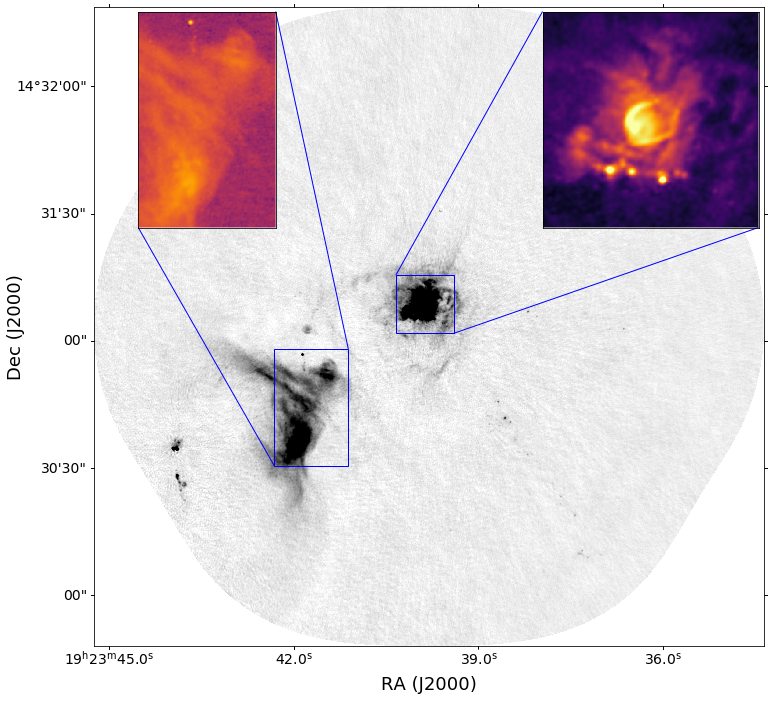

In [64]:
fieldid = 'W51IRS2'
pfxs = prefixes[fieldid]

finaliter_prefix_b3 = pfxs['finaliter_prefix_b3']
image_b3 = SpectralCube.read(f'{finaliter_prefix_b3}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

fig = pl.figure(figsize=(12,12))

fig = pl.figure(1, figsize=(10,10))
fig.clf()
ax = fig.add_subplot(projection=image_b3.wcs.celestial)

img = image_b3[0].value
norm = simple_norm(img, max_percent=99.5, min_percent=0.5, stretch='linear')
ax.imshow(img, cmap='gray_r', norm=norm)



tick_fontsize=14
ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("RA (J2000)", fontsize=18)
dec.set_axislabel("Dec (J2000)", fontsize=18, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticks(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticks(exclude_overlapping=True)



xl,xr = 1425,1700
yl,yu = 1475,1750
slc = [slice(yl,yu), slice(xl,xr)]
axins = inset_axes(ax, loc=1, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))

norm2 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')

axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap='inferno', norm=norm2)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


bx,tx = (850,1200)
by,ty = (850,1400)
slc = [slice(by,ty), slice(bx,tx)]
axins = inset_axes(ax, loc=2, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
norm3 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='log')
axins.imshow(img[slc], extent=[bx,tx,by,ty], cmap='inferno', norm=norm3)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=1, loc2=3, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.png', bbox_inches='tight')
pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.pdf', bbox_inches='tight')

/orange/adamginsburg/miniconda3/lib/python3.7/site-packages/astropy/units/quantity.py:1028: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out = super().__getitem__(key)
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return LazyMask(self._function, data=self._data[view],
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In t

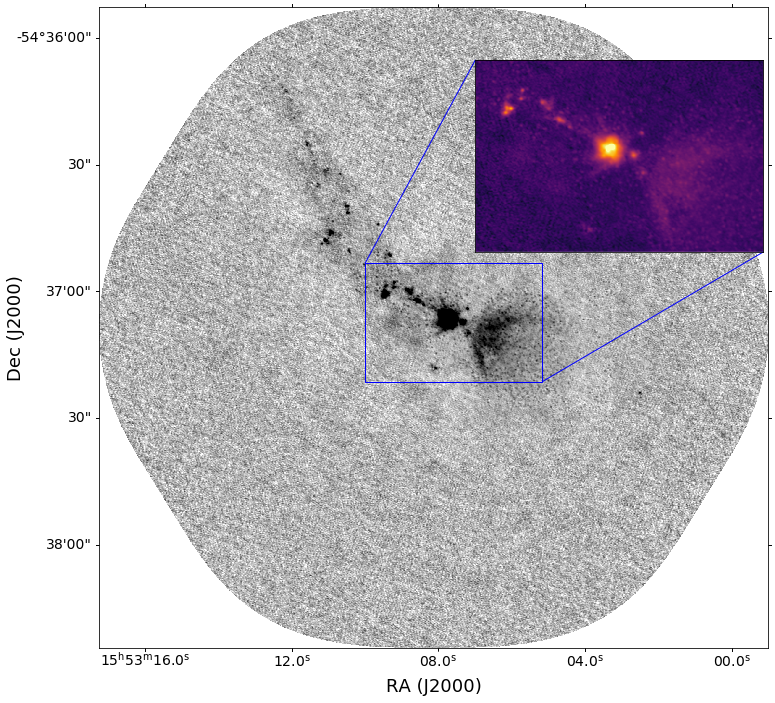

In [65]:
fieldid = 'G327'
pfxs = prefixes[fieldid]

finaliter_prefix_b3 = pfxs['finaliter_prefix_b3']
image_b3 = SpectralCube.read(f'{finaliter_prefix_b3}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

fig = pl.figure(figsize=(12,12))

fig = pl.figure(1, figsize=(10,10))
fig.clf()
ax = fig.add_subplot(projection=image_b3.wcs.celestial)

img = image_b3[0].value
norm = simple_norm(img, max_percent=99.8, min_percent=0.5, stretch='linear')
ax.imshow(img, cmap='gray_r', norm=norm)



tick_fontsize=14
ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("RA (J2000)", fontsize=18)
dec.set_axislabel("Dec (J2000)", fontsize=18, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticks(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticks(exclude_overlapping=True)



xl,xr = 900,1500
yl,yu = 900,1300
slc = [slice(yl,yu), slice(xl,xr)]
axins = inset_axes(ax, loc=1, width=4, height=4,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))

norm2 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')

axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap='inferno', norm=norm2)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


# bx,tx = (1050,1350)
# by,ty = (575,875)
# slc = [slice(by,ty), slice(bx,tx)]
# axins = inset_axes(ax, loc=3, width=3, height=3,
#                    axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
#                    axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
# norm3 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')
# axins.imshow(img[slc], extent=[bx,tx,by,ty], cmap='inferno', norm=norm3)
# mark_inset(parent_axes=ax, inset_axes=axins,
#            loc1=2, loc2=4, fc="none", ec="b")
# ra = axins.coords['ra']
# dec = axins.coords['dec']
# axins.set_xticklabels([])
# axins.set_yticklabels([])
# axins.xaxis.set_visible(False)
# axins.yaxis.set_visible(False)
# ra.set_ticks_visible(False)
# dec.set_ticks_visible(False)
# ra.set_axislabel('')
# dec.set_axislabel('')
# ra.ticklabels.set_visible(False)
# dec.ticklabels.set_visible(False)


pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.png', bbox_inches='tight')
pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.pdf', bbox_inches='tight')

/orange/adamginsburg/miniconda3/lib/python3.7/site-packages/astropy/units/quantity.py:1028: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out = super().__getitem__(key)
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return LazyMask(self._function, data=self._data[view],
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In t

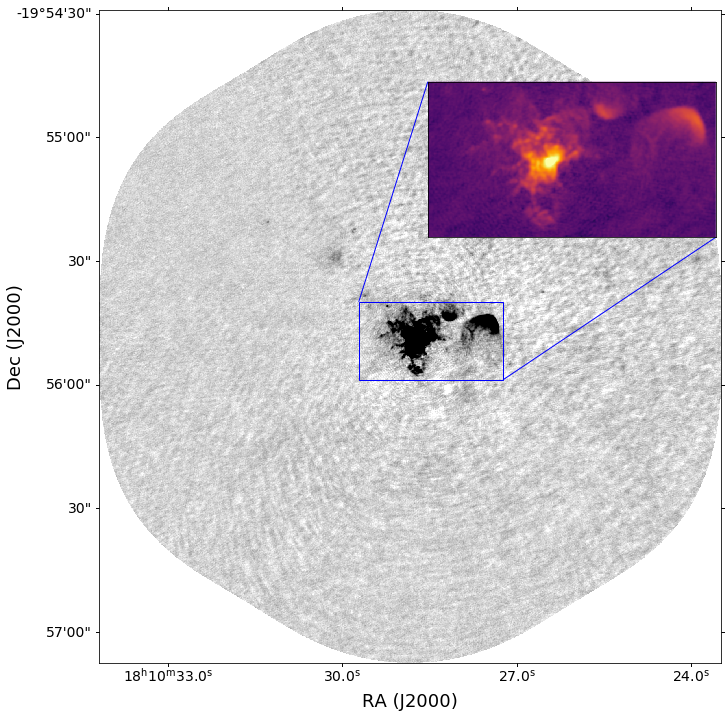

In [66]:
fieldid = 'G10'
pfxs = prefixes[fieldid]

finaliter_prefix_b3 = pfxs['finaliter_prefix_b3']
image_b3 = SpectralCube.read(f'{finaliter_prefix_b3}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

fig = pl.figure(figsize=(12,12))

fig = pl.figure(1, figsize=(10,10))
fig.clf()
ax = fig.add_subplot(projection=image_b3.wcs.celestial)

img = image_b3[0].value
norm = simple_norm(img, max_percent=99.5, min_percent=0.5, stretch='linear')
ax.imshow(img, cmap='gray_r', norm=norm)



tick_fontsize=14
ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("RA (J2000)", fontsize=18)
dec.set_axislabel("Dec (J2000)", fontsize=18, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticks(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticks(exclude_overlapping=True)



xl,xr = 900,1400
yl,yu = 980,1250
slc = [slice(yl,yu), slice(xl,xr)]
axins = inset_axes(ax, loc=1, width=4, height=4,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))

norm2 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='log')

axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap='inferno', norm=norm2)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


#bx,tx = (1050,1350)
#by,ty = (575,875)
#slc = [slice(by,ty), slice(bx,tx)]
#axins = inset_axes(ax, loc=3, width=3, height=3,
#                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
#                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
#norm3 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')
#axins.imshow(img[slc], extent=[bx,tx,by,ty], cmap='inferno', norm=norm3)
#mark_inset(parent_axes=ax, inset_axes=axins,
#           loc1=2, loc2=4, fc="none", ec="b")
#ra = axins.coords['ra']
#dec = axins.coords['dec']
#axins.set_xticklabels([])
#axins.set_yticklabels([])
#axins.xaxis.set_visible(False)
#axins.yaxis.set_visible(False)
#ra.set_ticks_visible(False)
#dec.set_ticks_visible(False)
#ra.set_axislabel('')
#dec.set_axislabel('')
#ra.ticklabels.set_visible(False)
#dec.ticklabels.set_visible(False)

pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.png', bbox_inches='tight')
pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.pdf', bbox_inches='tight')

/orange/adamginsburg/miniconda3/lib/python3.7/site-packages/astropy/units/quantity.py:1028: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out = super().__getitem__(key)
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return LazyMask(self._function, data=self._data[view],
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In t

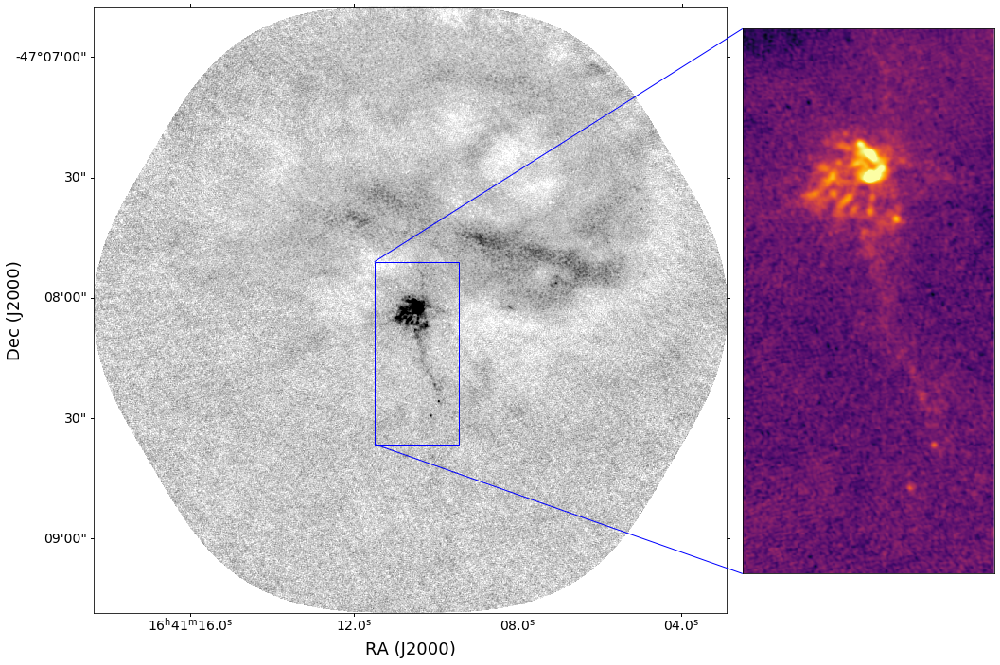

In [98]:
fieldid = 'G337'
pfxs = prefixes[fieldid]

finaliter_prefix_b3 = pfxs['finaliter_prefix_b3']
image_b3 = SpectralCube.read(f'{finaliter_prefix_b3}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

fig = pl.figure(figsize=(12,12))

fig = pl.figure(1, figsize=(10,10))
fig.clf()
ax = fig.add_subplot(projection=image_b3.wcs.celestial)

img = image_b3[0].value
norm = simple_norm(img, max_percent=99.9, min_percent=0.5, stretch='linear')
ax.imshow(img, cmap='gray_r', norm=norm)



tick_fontsize=14
ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("RA (J2000)", fontsize=18)
dec.set_axislabel("Dec (J2000)", fontsize=18, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticks(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticks(exclude_overlapping=True)



#xl,xr = 1050,1300
#yl,yu = 1050,1300
#slc = [slice(yl,yu), slice(xl,xr)]
#axins = inset_axes(ax, loc=1, width=3, height=3,
#                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
#                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
#
#norm2 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')
#
#axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap='inferno', norm=norm2)
#mark_inset(parent_axes=ax, inset_axes=axins,
#           loc1=2, loc2=4, fc="none", ec="b")
#ra = axins.coords['ra']
#dec = axins.coords['dec']
#axins.set_xticklabels([])
#axins.set_yticklabels([])
#axins.xaxis.set_visible(False)
#axins.yaxis.set_visible(False)
#ra.set_ticks_visible(False)
#dec.set_ticks_visible(False)
#ra.set_axislabel('')
#dec.set_axislabel('')
#ra.ticklabels.set_visible(False)
#dec.ticklabels.set_visible(False)


bx,tx = (1000,1300)
by,ty = (600,1250)
slc = [slice(by,ty), slice(bx,tx)]
axins = inset_axes(ax, loc=4, width=8, height=8,
                   bbox_to_anchor=[1120,150,100,100],
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
norm3 = simple_norm(img, max_percent=99.99, min_percent=0, stretch='asinh')
axins.imshow(img[slc], extent=[bx,tx,by,ty], cmap='inferno', norm=norm3)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=3, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.png', bbox_inches='tight')
pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.pdf', bbox_inches='tight')

/orange/adamginsburg/miniconda3/lib/python3.7/site-packages/astropy/units/quantity.py:1028: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out = super().__getitem__(key)
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return LazyMask(self._function, data=self._data[view],
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In t

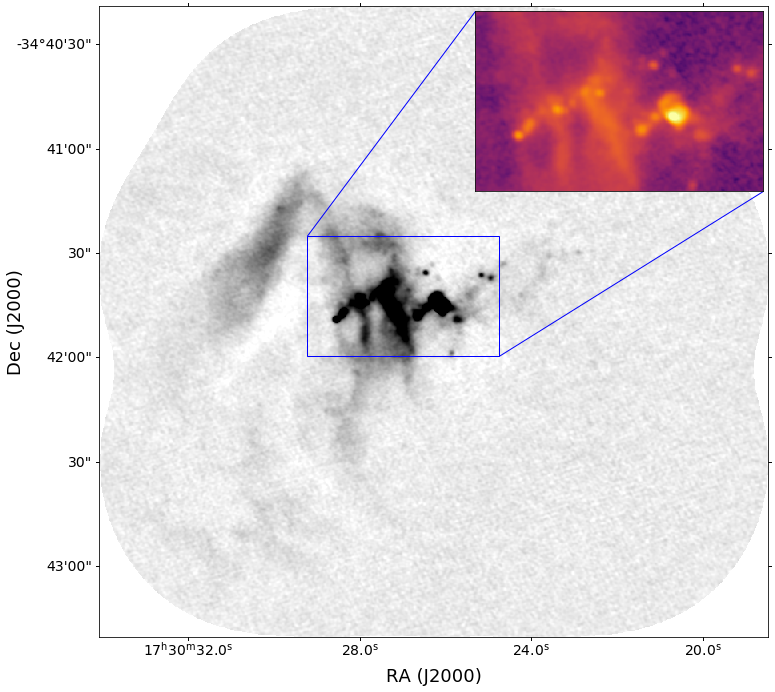

In [68]:
fieldid = 'G353'
pfxs = prefixes[fieldid]

finaliter_prefix_b3 = pfxs['finaliter_prefix_b3']
image_b3 = SpectralCube.read(f'{finaliter_prefix_b3}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

fig = pl.figure(figsize=(12,12))

fig = pl.figure(1, figsize=(10,10))
fig.clf()
ax = fig.add_subplot(projection=image_b3.wcs.celestial)

img = image_b3[0].value
norm = simple_norm(img, max_percent=99.5, min_percent=0.5, stretch='linear')
ax.imshow(img, cmap='gray_r', norm=norm)



tick_fontsize=14
ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("RA (J2000)", fontsize=18)
dec.set_axislabel("Dec (J2000)", fontsize=18, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticks(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticks(exclude_overlapping=True)



xl,xr = 260,500
yl,yu = 350,500
slc = [slice(yl,yu), slice(xl,xr)]
axins = inset_axes(ax, loc=1, width=4, height=2.5,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))

norm2 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='log')

axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap='inferno', norm=norm2)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


#bx,tx = (1050,1350)
#by,ty = (575,875)
#slc = [slice(by,ty), slice(bx,tx)]
#axins = inset_axes(ax, loc=3, width=3, height=3,
#                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
#                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
#norm3 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')
#axins.imshow(img[slc], extent=[bx,tx,by,ty], cmap='inferno', norm=norm3)
#mark_inset(parent_axes=ax, inset_axes=axins,
#           loc1=2, loc2=4, fc="none", ec="b")
#ra = axins.coords['ra']
#dec = axins.coords['dec']
#axins.set_xticklabels([])
#axins.set_yticklabels([])
#axins.xaxis.set_visible(False)
#axins.yaxis.set_visible(False)
#ra.set_ticks_visible(False)
#dec.set_ticks_visible(False)
#ra.set_axislabel('')
#dec.set_axislabel('')
#ra.ticklabels.set_visible(False)
#dec.ticklabels.set_visible(False)

pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.png', bbox_inches='tight')
pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.pdf', bbox_inches='tight')

/orange/adamginsburg/miniconda3/lib/python3.7/site-packages/astropy/units/quantity.py:1028: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out = super().__getitem__(key)
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return LazyMask(self._function, data=self._data[view],
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In t

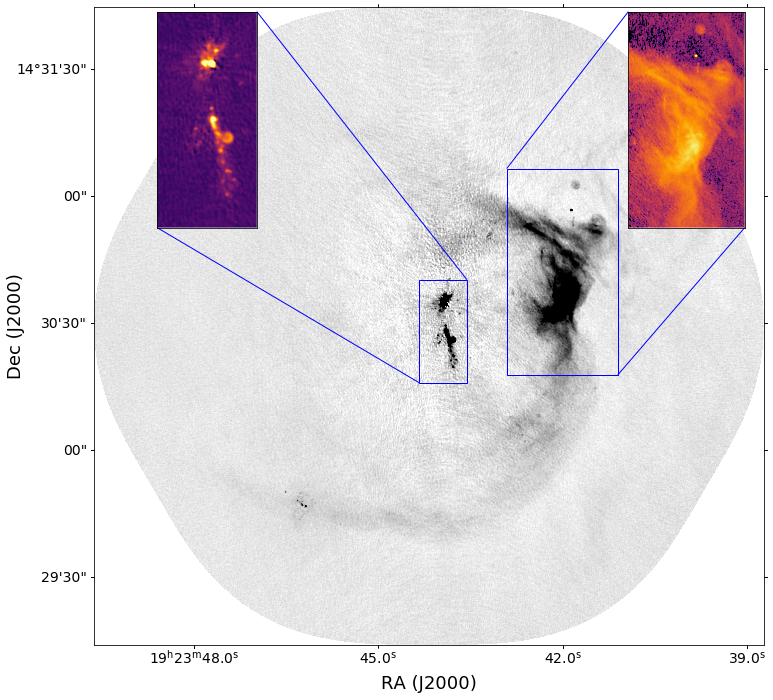

In [69]:
fieldid = 'W51-E'
pfxs = prefixes[fieldid]

finaliter_prefix_b3 = pfxs['finaliter_prefix_b3']
image_b3 = SpectralCube.read(f'{finaliter_prefix_b3}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

fig = pl.figure(figsize=(12,12))

fig = pl.figure(1, figsize=(10,10))
fig.clf()
ax = fig.add_subplot(projection=image_b3.wcs.celestial)

img = image_b3[0].value
norm = simple_norm(img, max_percent=99.5, min_percent=0.5, stretch='linear')
ax.imshow(img, cmap='gray_r', norm=norm)



tick_fontsize=14
ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("RA (J2000)", fontsize=18)
dec.set_axislabel("Dec (J2000)", fontsize=18, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticks(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticks(exclude_overlapping=True)



xl,xr = 2600,3300
yl,yu = 1700,3000
slc = [slice(yl,yu), slice(xl,xr)]
axins = inset_axes(ax, loc=1, width=2, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))

norm2 = simple_norm(img, max_percent=99.99, min_percent=1, stretch='log')

axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap='inferno', norm=norm2)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


bx,tx = (2050,2350)
by,ty = (1650,2300)
slc = [slice(by,ty), slice(bx,tx)]
axins = inset_axes(ax, loc=2, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
norm3 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')
axins.imshow(img[slc], extent=[bx,tx,by,ty], cmap='inferno', norm=norm3)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=1, loc2=3, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.png', bbox_inches='tight')
pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.pdf', bbox_inches='tight')

/orange/adamginsburg/miniconda3/lib/python3.7/site-packages/astropy/units/quantity.py:1028: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out = super().__getitem__(key)
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return LazyMask(self._function, data=self._data[view],
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In t

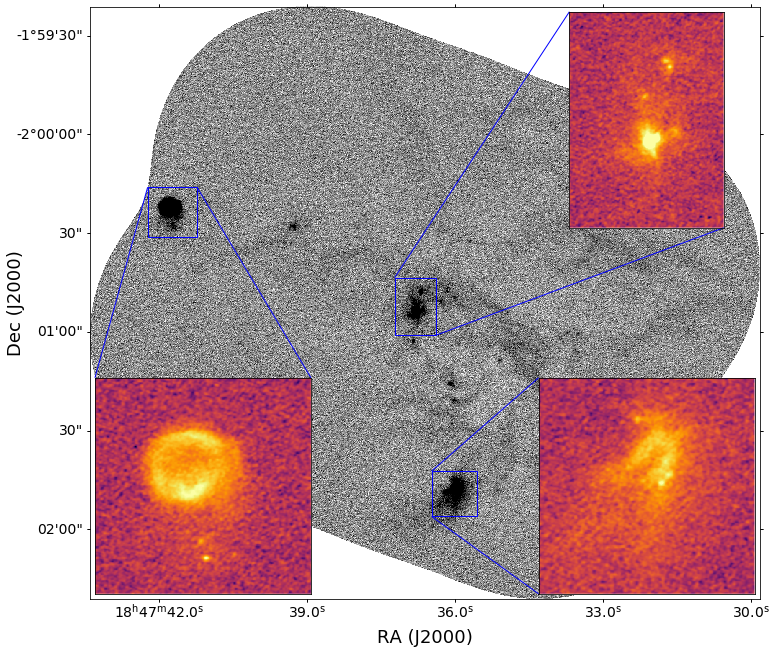

In [70]:
fieldid = 'W43MM2'
pfxs = prefixes[fieldid]

finaliter_prefix_b3 = pfxs['finaliter_prefix_b3']
image_b3 = SpectralCube.read(f'{finaliter_prefix_b3}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

fig = pl.figure(figsize=(12,12))

fig = pl.figure(1, figsize=(10,10))
fig.clf()
ax = fig.add_subplot(projection=image_b3.wcs.celestial)

img = image_b3[0].value
norm = simple_norm(img, max_percent=99.5, min_percent=0.5, stretch='linear')
ax.imshow(img, cmap='gray_r', norm=norm)



tick_fontsize=14
ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("RA (J2000)", fontsize=18)
dec.set_axislabel("Dec (J2000)", fontsize=18, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticks(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticks(exclude_overlapping=True)



xl,xr = 1850,2100
yl,yu = 1600,1950
slc = [slice(yl,yu), slice(xl,xr)]
axins = inset_axes(ax, loc=1, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))

norm2 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')

axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap='inferno', norm=norm2)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


bx,tx = (2075,2350)
by,ty = (500,775)
slc = [slice(by,ty), slice(bx,tx)]
axins = inset_axes(ax, loc=4, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
norm3 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')
axins.imshow(img[slc], extent=[bx,tx,by,ty], cmap='inferno', norm=norm3)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=3, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


bx,tx = (350,650)
by,ty = (2200,2500)
slc = [slice(by,ty), slice(bx,tx)]
axins = inset_axes(ax, loc=3, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
norm3 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')
axins.imshow(img[slc], extent=[bx,tx,by,ty], cmap='inferno', norm=norm3)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=1, loc2=2, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)



pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.png', bbox_inches='tight')
pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.pdf', bbox_inches='tight')

/orange/adamginsburg/miniconda3/lib/python3.7/site-packages/astropy/units/quantity.py:1028: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out = super().__getitem__(key)
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return LazyMask(self._function, data=self._data[view],
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In t

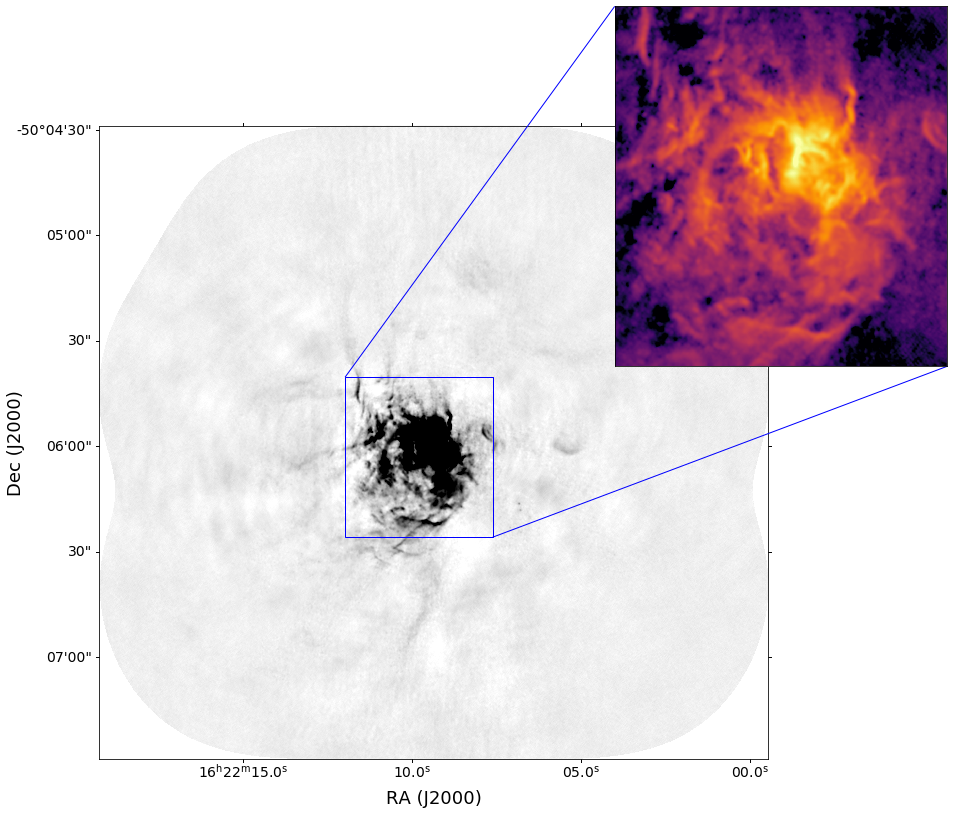

In [71]:
fieldid = 'G333'
pfxs = prefixes[fieldid]

finaliter_prefix_b3 = pfxs['finaliter_prefix_b3']
image_b3 = SpectralCube.read(f'{finaliter_prefix_b3}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

fig = pl.figure(figsize=(12,12))

fig = pl.figure(1, figsize=(10,10))
fig.clf()
ax = fig.add_subplot(projection=image_b3.wcs.celestial)

img = image_b3[0].value
norm = simple_norm(img, max_percent=99., min_percent=0.5, stretch='linear')
ax.imshow(img, cmap='gray_r', norm=norm)



tick_fontsize=14
ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("RA (J2000)", fontsize=18)
dec.set_axislabel("Dec (J2000)", fontsize=18, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticks(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticks(exclude_overlapping=True)



xl,xr = 1000,1600
yl,yu = 900,1550
slc = [slice(yl,yu), slice(xl,xr)]
axins = inset_axes(ax, loc=1, width=5, height=5,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial),
                   bbox_to_anchor=(675,575,300,300),
                  )

norm2 = simple_norm(img, max_percent=99.995, min_percent=1, stretch='log')

axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap='inferno', norm=norm2)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


#bx,tx = (1275,1500)
#by,ty = (1225,1450)
#slc = [slice(by,ty), slice(bx,tx)]
#axins = inset_axes(ax, loc=3, width=3, height=3,
#                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
#                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
#norm3 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')
#axins.imshow(img[slc], extent=[bx,tx,by,ty], cmap='inferno', norm=norm3)
#mark_inset(parent_axes=ax, inset_axes=axins,
#           loc1=2, loc2=4, fc="none", ec="b")
#ra = axins.coords['ra']
#dec = axins.coords['dec']
#axins.set_xticklabels([])
#axins.set_yticklabels([])
#axins.xaxis.set_visible(False)
#axins.yaxis.set_visible(False)
#ra.set_ticks_visible(False)
#dec.set_ticks_visible(False)
#ra.set_axislabel('')
#dec.set_axislabel('')
#ra.ticklabels.set_visible(False)
#dec.ticklabels.set_visible(False)


pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms_B3.png', bbox_inches='tight')
pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms_B3.pdf', bbox_inches='tight')

/orange/adamginsburg/miniconda3/lib/python3.7/site-packages/astropy/units/quantity.py:1028: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out = super().__getitem__(key)
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return LazyMask(self._function, data=self._data[view],
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In t

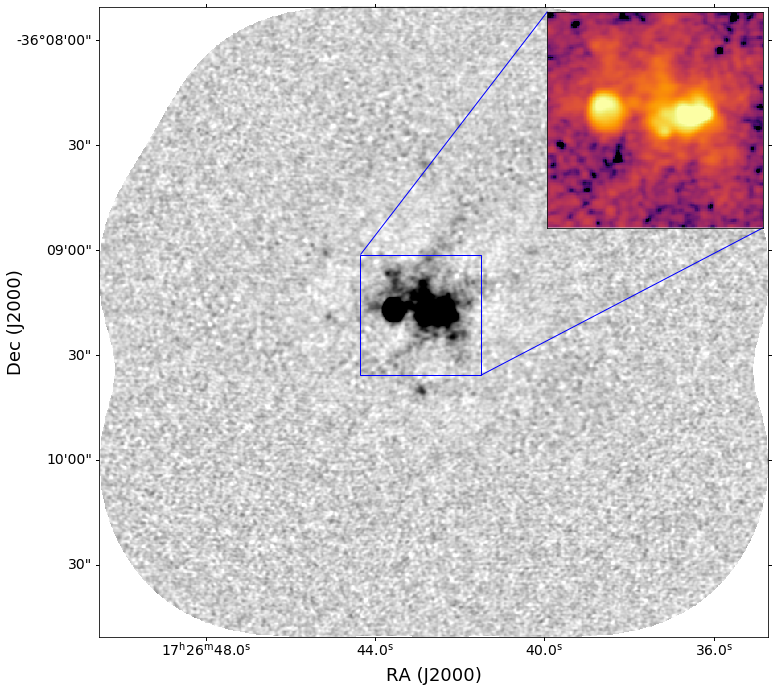

In [72]:
fieldid = 'G351'
pfxs = prefixes[fieldid]

finaliter_prefix_b3 = pfxs['finaliter_prefix_b3']
image_b3 = SpectralCube.read(f'{finaliter_prefix_b3}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

fig = pl.figure(figsize=(12,12))

fig = pl.figure(1, figsize=(10,10))
fig.clf()
ax = fig.add_subplot(projection=image_b3.wcs.celestial)

img = image_b3[0].value
norm = simple_norm(img, max_percent=99.5, min_percent=0.5, stretch='linear')
ax.imshow(img, cmap='gray_r', norm=norm)



tick_fontsize=14
ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("RA (J2000)", fontsize=18)
dec.set_axislabel("Dec (J2000)", fontsize=18, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticks(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticks(exclude_overlapping=True)



xl,xr = 325,475
yl,yu = 325,475
slc = [slice(yl,yu), slice(xl,xr)]
axins = inset_axes(ax, loc=1, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))

norm2 = simple_norm(img, max_percent=99.95, min_percent=1, stretch='log')

axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap='inferno', norm=norm2)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


#bx,tx = (400,600)
#by,ty = (500,750)
#slc = [slice(by,ty), slice(bx,tx)]
#axins = inset_axes(ax, loc=3, width=3, height=3,
#                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
#                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
#norm3 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')
#axins.imshow(img[slc], extent=[bx,tx,by,ty], cmap='inferno', norm=norm3)
#mark_inset(parent_axes=ax, inset_axes=axins,
#           loc1=2, loc2=4, fc="none", ec="b")
#ra = axins.coords['ra']
#dec = axins.coords['dec']
#axins.set_xticklabels([])
#axins.set_yticklabels([])
#axins.xaxis.set_visible(False)
#axins.yaxis.set_visible(False)
#ra.set_ticks_visible(False)
#dec.set_ticks_visible(False)
#ra.set_axislabel('')
#dec.set_axislabel('')
#ra.ticklabels.set_visible(False)
#dec.ticklabels.set_visible(False)


pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.png', bbox_inches='tight')
pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.pdf', bbox_inches='tight')

/orange/adamginsburg/miniconda3/lib/python3.7/site-packages/astropy/units/quantity.py:1028: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out = super().__getitem__(key)
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return LazyMask(self._function, data=self._data[view],
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In t

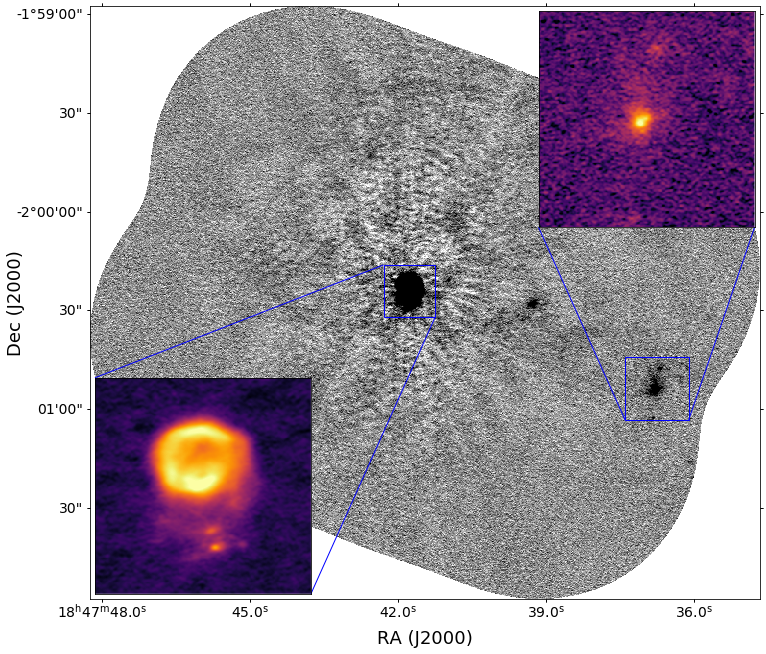

In [73]:
fieldid = 'W43MM3'
pfxs = prefixes[fieldid]

finaliter_prefix_b3 = pfxs['finaliter_prefix_b3']
image_b3 = SpectralCube.read(f'{finaliter_prefix_b3}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

fig = pl.figure(figsize=(12,12))

fig = pl.figure(1, figsize=(10,10))
fig.clf()
ax = fig.add_subplot(projection=image_b3.wcs.celestial)

img = image_b3[0].value
norm = simple_norm(img, max_percent=99.5, min_percent=0.5, stretch='linear')
ax.imshow(img, cmap='gray_r', norm=norm)



tick_fontsize=14
ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("RA (J2000)", fontsize=18)
dec.set_axislabel("Dec (J2000)", fontsize=18, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticks(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticks(exclude_overlapping=True)



xl,xr = 2325,2600
yl,yu = 775,1050
slc = [slice(yl,yu), slice(xl,xr)]
axins = inset_axes(ax, loc=1, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))

norm2 = simple_norm(img, max_percent=99.87, min_percent=1, stretch='asinh')

axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap='inferno', norm=norm2)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=3, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


bx,tx = (1275,1500)
by,ty = (1225,1450)
slc = [slice(by,ty), slice(bx,tx)]
axins = inset_axes(ax, loc=3, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
norm3 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')
axins.imshow(img[slc], extent=[bx,tx,by,ty], cmap='inferno', norm=norm3)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.png', bbox_inches='tight')
pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.pdf', bbox_inches='tight')

/orange/adamginsburg/miniconda3/lib/python3.7/site-packages/astropy/units/quantity.py:1028: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out = super().__getitem__(key)
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return LazyMask(self._function, data=self._data[view],
/orange/adamginsburg/repos/spectral-cube/spectral_cube/masks.py:657: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In t

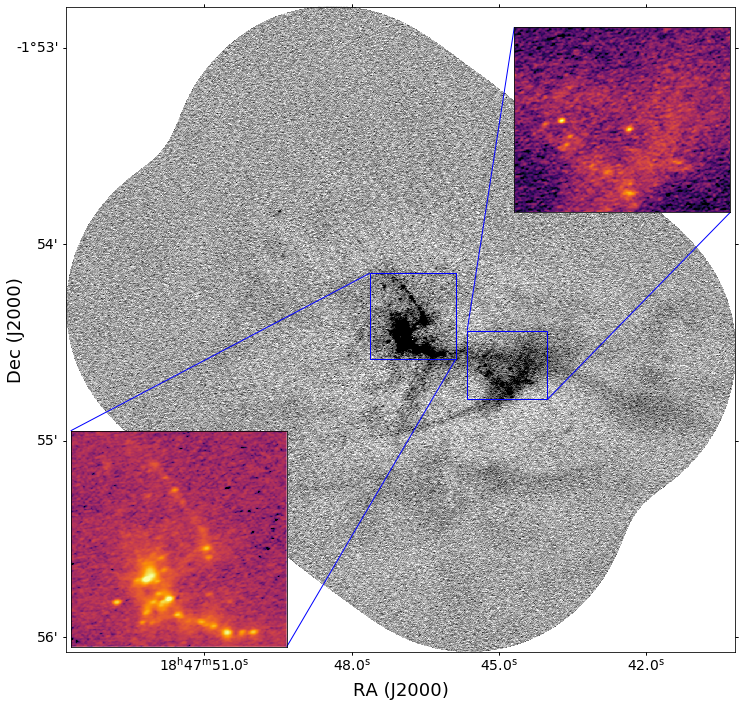

In [74]:
fieldid = 'W43MM1'
pfxs = prefixes[fieldid]

finaliter_prefix_b3 = pfxs['finaliter_prefix_b3']
image_b3 = SpectralCube.read(f'{finaliter_prefix_b3}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

fig = pl.figure(figsize=(12,12))

fig = pl.figure(1, figsize=(10,10))
fig.clf()
ax = fig.add_subplot(projection=image_b3.wcs.celestial)

img = image_b3[0].value
norm = simple_norm(img, max_percent=99.5, min_percent=0.5, stretch='linear')
ax.imshow(img, cmap='gray_r', norm=norm)



tick_fontsize=14
ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("RA (J2000)", fontsize=18)
dec.set_axislabel("Dec (J2000)", fontsize=18, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticks(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticks(exclude_overlapping=True)



xl,xr = 1750,2100
yl,yu = 1100,1400
slc = [slice(yl,yu), slice(xl,xr)]
axins = inset_axes(ax, loc=1, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))

norm2 = simple_norm(img, max_percent=99.95, min_percent=1, stretch='asinh')

axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap='inferno', norm=norm2)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


bx,tx = (1325,1700)
by,ty = (1275,1650)
slc = [slice(by,ty), slice(bx,tx)]
axins = inset_axes(ax, loc=3, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
norm3 = simple_norm(img, max_percent=99.998, min_percent=0.2, stretch='log')
axins.imshow(img[slc], extent=[bx,tx,by,ty], cmap='inferno', norm=norm3)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.png', bbox_inches='tight')
pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.pdf', bbox_inches='tight')

In [75]:
from astropy import units as u

from mpl_toolkits.axes_grid1 import make_axes_locatable
import numpy as np
from astropy import coordinates

[array(273.57103114), array(-17.94375646)]
<SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    (273.57103114, -17.94375646)>


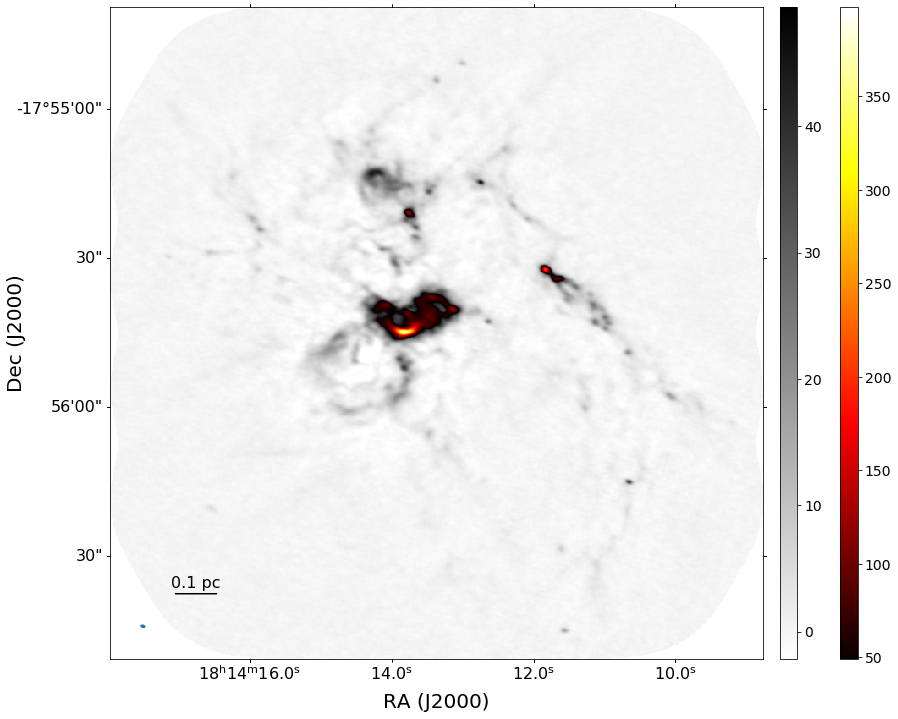

In [76]:
def make_multifig(fieldid, 
                  overview_vis_pars={'max_percent':99.5, 'min_percent':0.5, 'stretch':'linear'},
                  overview_cmap='gray_r',
                  inner_stretch='linear',
                  inner_maxpct=100,
                  inset_cmap='inferno',
                  band='B3'):
    
    pfxs = prefixes[fieldid]

    finaliter_prefix = pfxs[f'finaliter_prefix_{band}'.lower()]
    image = SpectralCube.read(f'{finaliter_prefix}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube().to(u.mJy)

    fig = pl.figure(figsize=(12,12))

    fig = pl.figure(1, figsize=(10,10))
    fig.clf()
    ax = fig.add_subplot(projection=image.wcs.celestial)

    img = image[0].value
    norm = simple_norm(img, **overview_vis_pars)
    im1 = ax.imshow(img, cmap=overview_cmap, norm=norm)
    
    cm = pl.cm.hot
    cm.set_under((0,0,0,0))
    
    norm2 = simple_norm(img, min_cut=norm.vmax*0.99, stretch=inner_stretch, max_percent=inner_maxpct)
    norm2.vmin = norm.vmax*0.99
    im2 = ax.imshow(img, cmap=cm, norm=norm2)
    
    # create an axes on the right side of ax. The width of cax will be 5%
    # of ax and the padding between cax and ax will be fixed at 0.05 inch.
    divider = make_axes_locatable(ax)
    #cax1 = divider.append_axes("right", size="5%", pad=0.05)
    #cax2 = divider.append_axes("right", size="5%", pad=0.1)
    cax1 = fig.add_axes([ax.get_position().x1+0.01,
                         ax.get_position().y0,
                         0.02,
                         ax.get_position().height])
    cax2 = fig.add_axes([ax.get_position().x1+0.08,
                         ax.get_position().y0,
                         0.02,
                         ax.get_position().height])    
    
    cb2 = pl.colorbar(mappable=im2, cax=cax2)
    cb1 = pl.colorbar(mappable=im1, cax=cax1)
    cb1.ax.tick_params(labelsize=14)
    cb2.ax.tick_params(labelsize=14)

    tick_fontsize=16
    ra = ax.coords['ra']
    ra.set_major_formatter('hh:mm:ss.s')
    dec = ax.coords['dec']
    ra.set_axislabel("RA (J2000)", fontsize=20)
    dec.set_axislabel("Dec (J2000)", fontsize=20, minpad=0.0)
    ra.ticklabels.set_fontsize(tick_fontsize)
    ra.set_ticks(exclude_overlapping=True)
    dec.ticklabels.set_fontsize(tick_fontsize)
    dec.set_ticks(exclude_overlapping=True)
    
    print(image.wcs.celestial.wcs_pix2world(0.1*img.shape[1], 0.1*img.shape[0], 0))
    left_side = coordinates.SkyCoord(*image.wcs.celestial.wcs_pix2world(0.1*img.shape[1], 0.1*img.shape[0], 0)*u.deg, frame='fk5')
    print(left_side)
    length = (0.1*u.pc / field_data.distances[fieldid]).to(u.arcsec, u.dimensionless_angles())
    make_scalebar(ax, left_side, length, color='k', linestyle='-', label='0.1 pc',
                  fontsize=16, text_offset=0.5*u.arcsec)
    
    ell = image.beam.ellipse_to_plot(0.05*img.shape[1], 0.05*img.shape[0], pixscale=image.wcs.celestial.pixel_scale_matrix[1,1]*u.deg)
    ax.add_patch(ell)

    
    pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_multicolor_{band}.png', bbox_inches='tight')
    pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_multicolor_{band}.pdf', bbox_inches='tight')
make_multifig('G12', band='B6')

[array(290.95223478), array(14.4914343)]
<SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    (290.95223478, 14.4914343)>


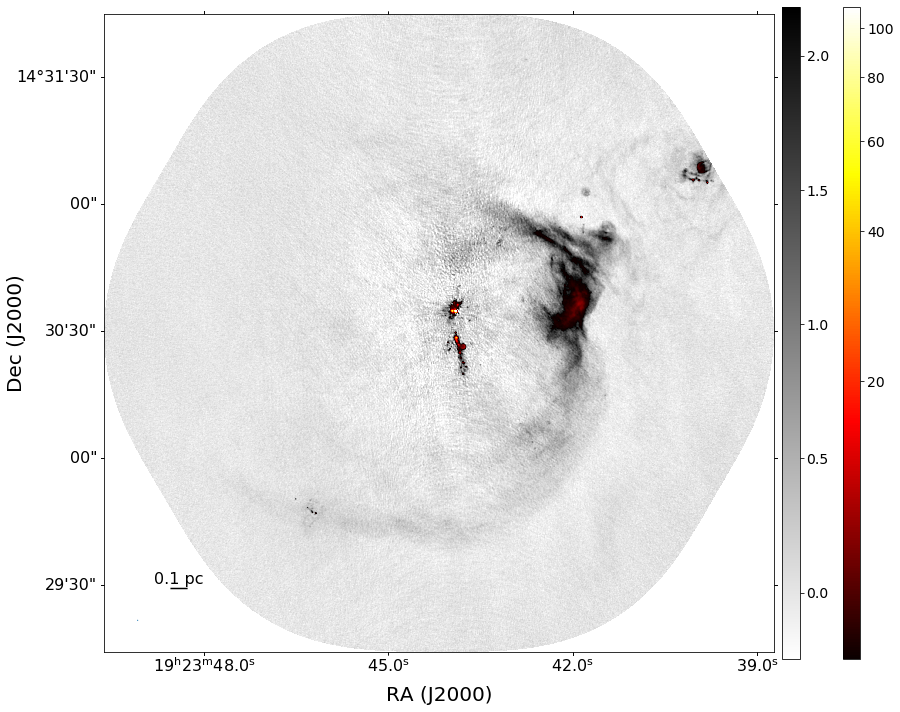

In [77]:
fieldid='W51-E'
make_multifig(fieldid, band='B3', inner_stretch='asinh', inner_maxpct=99.999)

[array(290.9446997), array(14.49736221)]
<SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    (290.9446997, 14.49736221)>


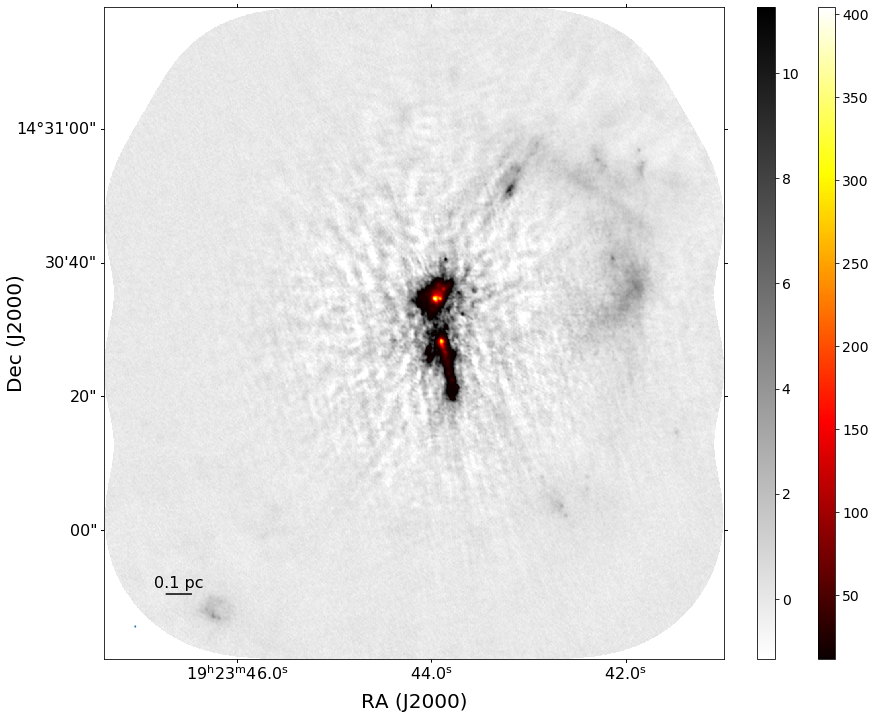

In [78]:
make_multifig(fieldid, band='B6')

[array(273.57103114), array(-17.94375646)]
<SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    (273.57103114, -17.94375646)>


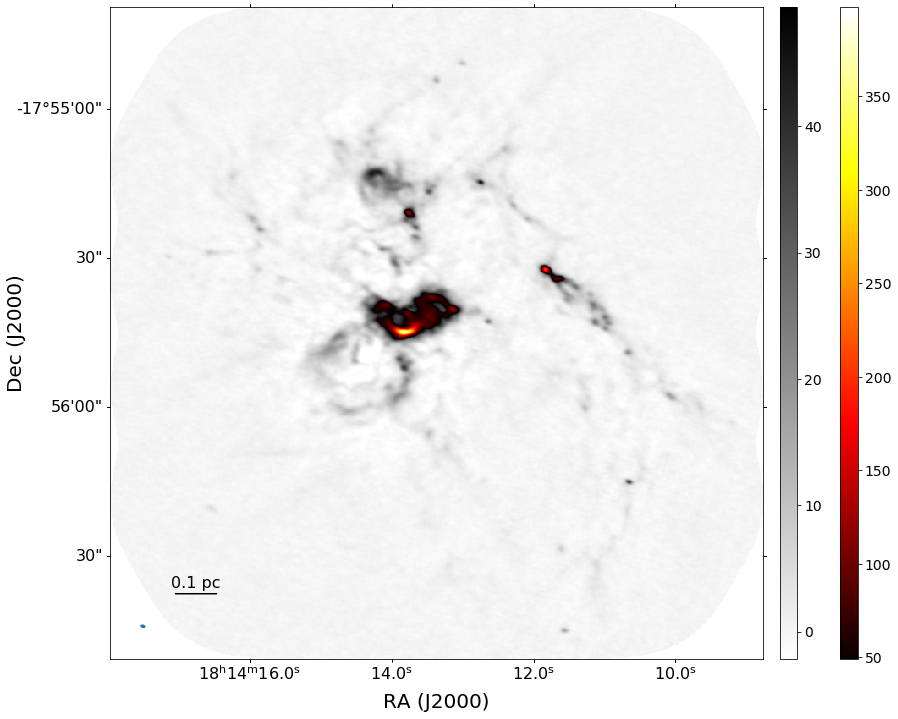

In [79]:
make_multifig('G12', band='B6')

In [80]:
import imp
import field_data

imp.reload(field_data)

<module 'field_data' from '/orange/adamginsburg/ALMA_IMF/reduction/analysis/field_data.py'>

[array(239.52863823), array(-53.98663305)]
<SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    (239.52863823, -53.98663305)>


[array(245.57199139), array(-50.11969559)]
<SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    (245.57199139, -50.11969559)>


[array(273.57800459), array(-17.9491278)]
<SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    (273.57800459, -17.9491278)>


[array(290.93399386), array(14.50087006)]
<SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    (290.93399386, 14.50087006)>


[array(271.60862849), array(-21.63701087)]
<SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    (271.60862849, -21.63701087)>


[array(238.3142963), array(-54.63589411)]
<SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    (238.3142963, -54.63589411)>


[array(272.63798721), array(-19.94766012)]
<SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    (272.63798721, -19.94766012)>


[array(250.32007988), array(-47.15093567)]
<SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    (250.32007988, -47.15093567)>


[array(250.16764906), array(-45.71227353)]
<SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    (250.16764906, -45.71227353)>


[array(261.70391578), array(-36.17570028)]
<SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    (261.70391578, -36.17570028)>


[array(262.6354839), array(-34.71724707)]
<SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    (262.6354839, -34.71724707)>


[array(281.94538), array(-2.02768649)]
<SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    (281.94538, -2.02768649)>


[array(281.92515591), array(-2.03418454)]
<SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    (281.92515591, -2.03418454)>


[array(290.95223478), array(14.4914343)]
<SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    (290.95223478, 14.4914343)>


[array(281.96855731), array(-1.92907177)]
<SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    (281.96855731, -1.92907177)>


[array(239.52098322), array(-53.98009395)]
<SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    (239.52098322, -53.98009395)>


[array(245.56395158), array(-50.11551531)]
<SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    (245.56395158, -50.11551531)>


[array(273.57103114), array(-17.94375646)]
<SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    (273.57103114, -17.94375646)>


[array(290.9264769), array(14.50678888)]
<SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    (290.9264769, 14.50678888)>


[array(271.60390614), array(-21.633371)]
<SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    (271.60390614, -21.633371)>


/orange/adamginsburg/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


[array(238.30405577), array(-54.63117487)]
<SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    (238.30405577, -54.63117487)>


/orange/adamginsburg/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


[array(272.63164691), array(-19.94034675)]
<SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    (272.63164691, -19.94034675)>


/orange/adamginsburg/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


[array(250.30934038), array(-47.14375436)]
<SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    (250.30934038, -47.14375436)>


/orange/adamginsburg/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


[array(250.15716328), array(-45.704899)]
<SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    (250.15716328, -45.704899)>


/orange/adamginsburg/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


[array(261.69564153), array(-36.1702616)]
<SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    (261.69564153, -36.1702616)>


/orange/adamginsburg/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


[array(262.62718527), array(-34.71171059)]
<SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    (262.62718527, -34.71171059)>


/orange/adamginsburg/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


[array(281.93302026), array(-2.0184636)]
<SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    (281.93302026, -2.0184636)>


/orange/adamginsburg/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


[array(281.91284199), array(-2.02507832)]
<SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    (281.91284199, -2.02507832)>


/orange/adamginsburg/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


[array(290.9446997), array(14.49736221)]
<SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    (290.9446997, 14.49736221)>


/orange/adamginsburg/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


[array(281.91284199), array(-2.02507832)]
<SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    (281.91284199, -2.02507832)>


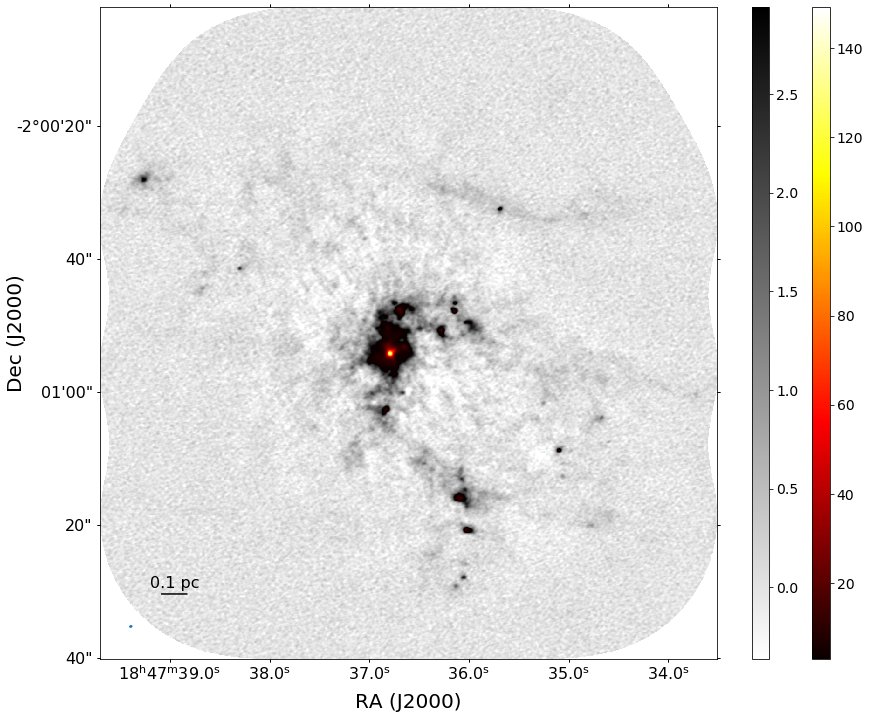

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

In [81]:
for band in ('B3','B6'):
    for fieldid in prefixes:
        make_multifig(fieldid, band=band)

[array(290.95223478), array(14.4914343)]
<SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    (290.95223478, 14.4914343)>


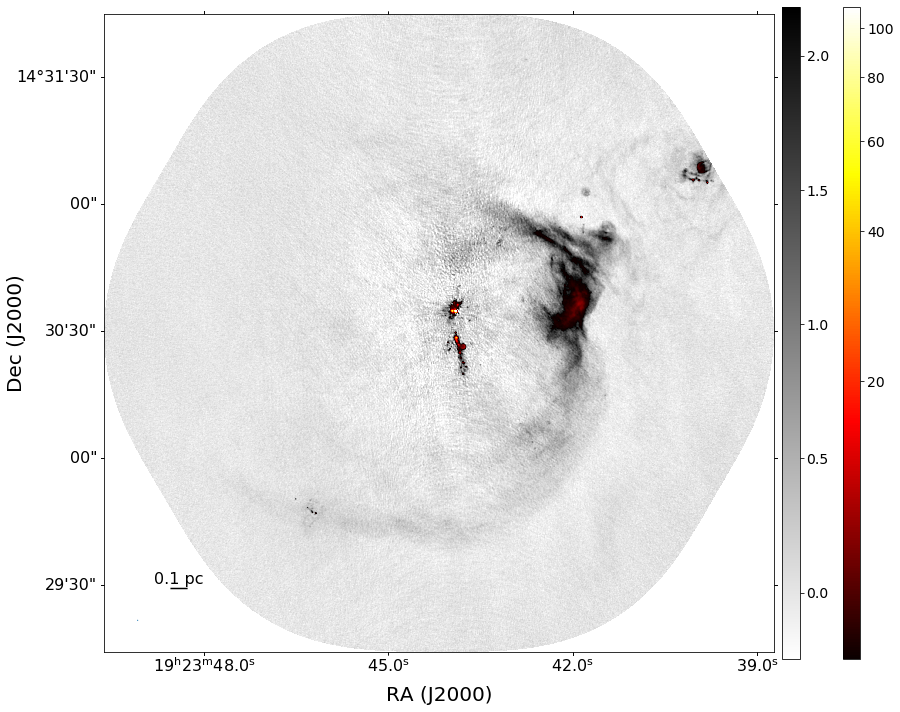

In [82]:
fieldid='W51-E'
make_multifig(fieldid, band='B3', inner_stretch='asinh', inner_maxpct=99.999)

[array(290.93399386), array(14.50087006)]
<SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    (290.93399386, 14.50087006)>


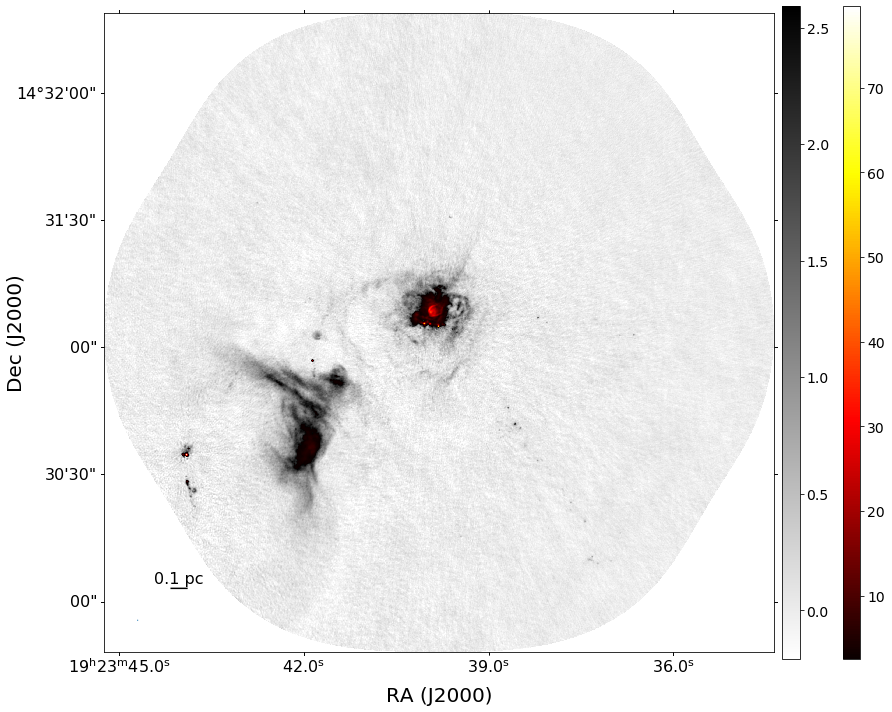

In [83]:
fieldid='W51IRS2'
make_multifig(fieldid, band='B3', inner_stretch='linear')

[array(290.9264769), array(14.50678888)]
<SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    (290.9264769, 14.50678888)>


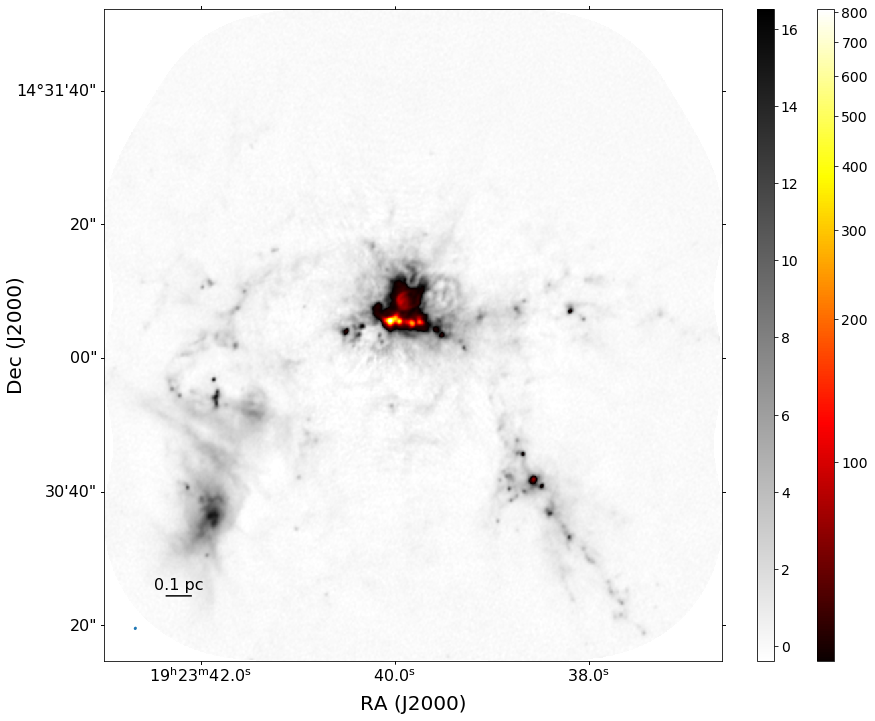

In [84]:
fieldid='W51IRS2'
make_multifig(fieldid, band='B6', inner_stretch='asinh', inner_maxpct=99.9995)